In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_train = pd.read_csv(('train.csv'))
df_cleaned = pd.read_csv(('df_cleaned.csv'))

In [27]:
cfips_list = df_cleaned.cfips
df_train = df_train[df_train.cfips.isin(cfips_list)]

In [28]:
df = df_train[["cfips", 'first_day_of_month', "microbusiness_density"]]
mask = ((df.microbusiness_density == 0))
df = df.pivot(index='cfips', columns='first_day_of_month', values='microbusiness_density')
df = df.fillna(0)

from sklearn.metrics.pairwise import euclidean_distances
X = df.values
dist = euclidean_distances(X, X)
dist = pd.DataFrame(dist)
dist.index = df.index
dist.columns = dist.index
print(f"Euclidean distances dataframe shape is: {dist.shape}")
dist.head()

Euclidean distances dataframe shape is: (3085, 3085)


cfips,1001,1003,1005,1007,1009,1011,1013,1015,1017,1019,...,56027,56029,56031,56033,56035,56037,56039,56041,56043,56045
cfips,,,,,,,,,,,,,,,,,,,,,
1001,0.000000,29.556795,12.895536,11.874929,9.303092,14.101265,11.065914,2.829182,11.202628,12.504850,...,10.283439,17.809755,2.868046,505.161486,26.203104,2.095152,144.824318,5.660521,1.889969,9.392556
1003,29.556795,0.000000,42.437527,41.393925,38.844253,43.625468,40.379436,32.140328,40.736643,42.032006,...,39.799866,11.863868,27.985019,479.478507,4.196430,29.915355,115.351493,24.934053,31.191761,38.933490
1005,12.895536,42.437527,0.000000,1.215073,3.602387,1.396112,3.678453,10.351931,1.762304,0.665639,...,2.896020,30.665538,14.728440,516.635929,39.064970,12.720783,157.682454,17.941489,11.315041,3.523592
1007,11.874929,41.393925,1.215073,0.000000,2.627938,2.266151,3.664661,9.275294,0.809200,0.850113,...,2.313452,29.609640,13.648139,515.931982,38.045908,11.655409,156.616432,16.856641,10.322504,2.552048
1009,9.303092,38.844253,3.602387,2.627938,0.000000,4.840657,3.203045,6.788592,1.956603,3.226506,...,1.409196,27.079578,11.202883,513.427685,35.472854,9.180298,154.100153,14.426233,7.731779,0.276581


In [29]:
dist.loc[24005,:].sort_values()

cfips
24005      0.000000
29077      0.912613
39061      1.018311
18097      1.169066
53035      1.243183
            ...    
16021    328.318603
8105     383.499488
46127    388.158278
56033    486.408717
32510    763.054619
Name: 24005, Length: 3085, dtype: float64

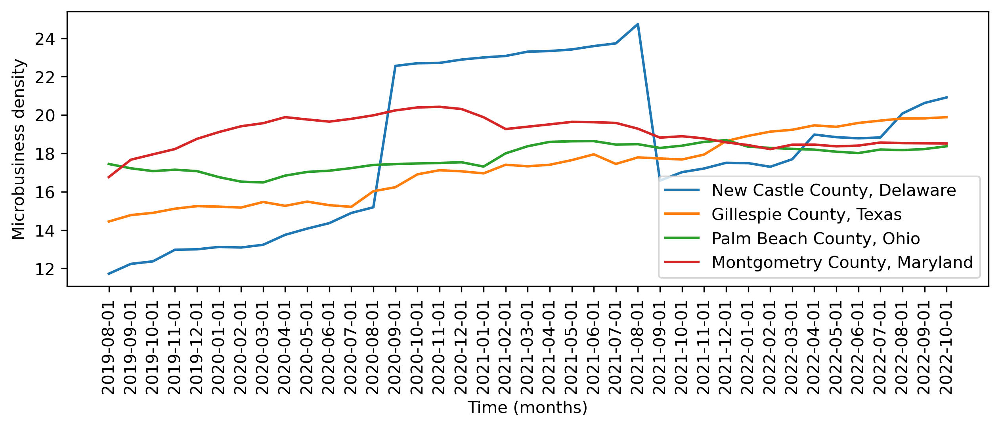

In [30]:
# plt.figure(figsize=(10, 3), dpi=300)
# plt.plot(df.loc[10003, :], label = 'Baltimore County, Maryland')
# plt.plot(df.loc[48171, :],  label='Greene County, Missori') # Greene County, Missori
# plt.plot(df.loc[30045, :], label = 'Hamilton County, Ohio') # Hamilton County, Ohio
# plt.plot(df.loc[48155, :], label = 'Marion County, Indiana') # Marion County, Indiana
# plt.xticks(rotation=90)  # Rotate the x-axis labels by 90 degrees
# plt.xlabel("Time (months)")
# plt.ylabel("Microbusiness density")
# plt.legend()
# plt.show()

plt.figure(figsize=(10, 3), dpi=300)
plt.plot(df.loc[10003, :], label = 'New Castle County, Delaware')
plt.plot(df.loc[48171, :],  label='Gillespie County, Texas') # Greene County, Missori
plt.plot(df.loc[12099, :], label = 'Palm Beach County, Ohio') # Hamilton County, Ohio
plt.plot(df.loc[24031, :], label = 'Montgometry County, Maryland') # Marion County, Indiana
plt.xticks(rotation=90)  # Rotate the x-axis labels by 90 degrees
plt.xlabel("Time (months)")
plt.ylabel("Microbusiness density")
plt.legend()
plt.show()

In [31]:
cfips = []
k_neighbours = []
class config:
    K = 4

for index, row in dist.iterrows():
    cfips.append(index)
    k_neighbours.append(row.sort_values(ascending=True)[1:config.K+1].index.tolist() + \
                        row.sort_values(ascending=True)[1:config.K+1].values.tolist())
aux = pd.DataFrame([cfips, k_neighbours]).T
aux.columns = ["cfips", "knn"]
knn = pd.DataFrame(aux["knn"].to_list())
knn.columns = ["knn_" + str(x) for x in np.arange(1,config.K+1, 1)] + \
              ["dist_" + str(x) for x in np.arange(1,config.K+1, 1)]  
knn.index = aux["cfips"]
print(f"Most similar counties dataframe shape is: {knn.shape}")
knn = knn[['knn_1', 'knn_2', 'knn_3']]

knn[knn.index ==10003]

Most similar counties dataframe shape is: (3085, 8)


,knn_1,knn_2,knn_3
cfips,,,
10003,48171,12099,24031


In [ ]:
knn.to_csv("knn.csv", index=True)

,source,destination,weight
0,1001,42073,0.473444
1,1001,48245,0.515782
2,1003,34013,1.269794
3,1003,9003,1.342669
4,1005,5107,0.305875


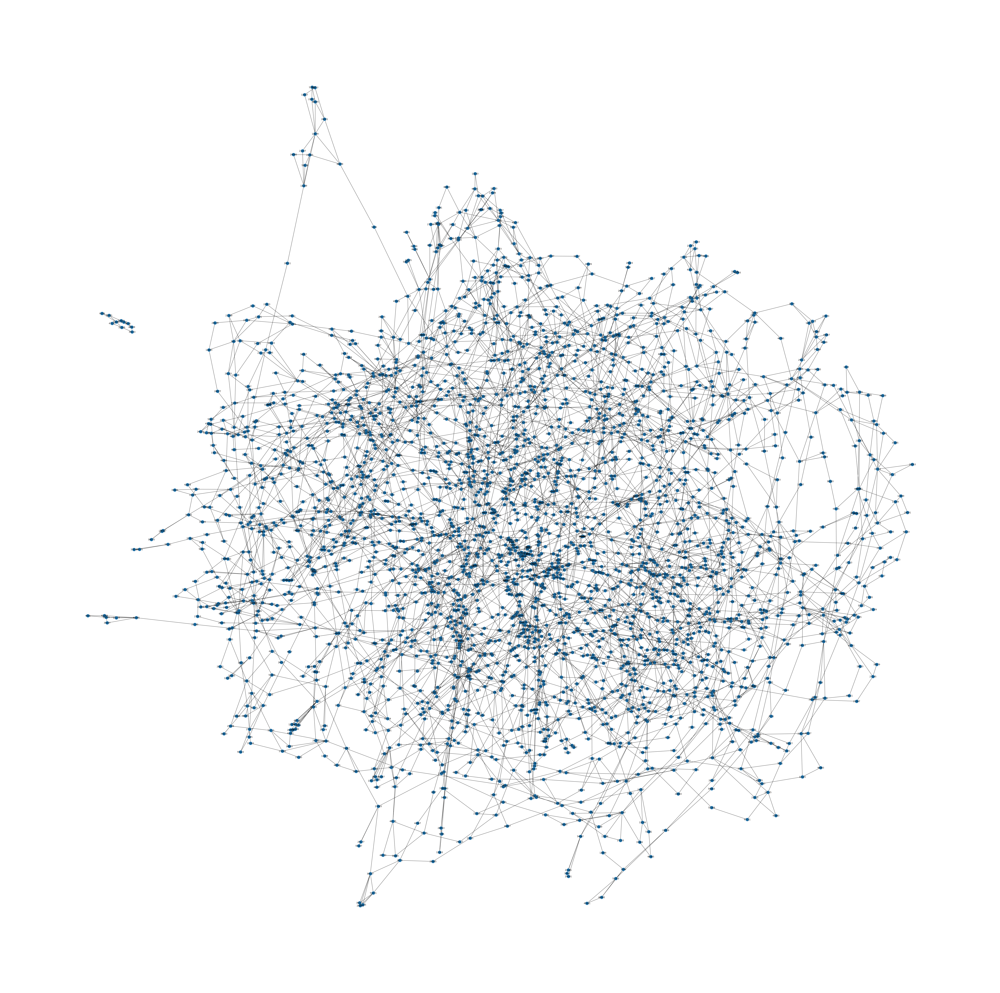

In [339]:
import networkx as nx
cfips = []
graphs = []

for index, row in dist.iterrows():
    cfips.append(index)
    for idx, value in row.sort_values(ascending=True)[1:3].items():
        graphs.append([index, idx, value])
        
graph = pd.DataFrame(graphs)
graph.columns = ["source", "destination", "weight"]
display(graph.head())

G = nx.from_pandas_edgelist(graph, source='source', target='destination',
                            edge_attr='weight')

def save_graph(graph,file_name):
    #initialze Figure
    plt.figure(num=None, figsize=(100, 100), dpi=80)
    plt.axis('off')
    fig = plt.figure(1)
    pos = nx.spring_layout(graph)
    nx.draw_networkx_nodes(graph,pos)
    nx.draw_networkx_edges(graph,pos)
    nx.draw_networkx_labels(graph,pos)
    plt.savefig(file_name,bbox_inches="tight")
    del fig
    
save_graph(G,"my_graph.jpg")

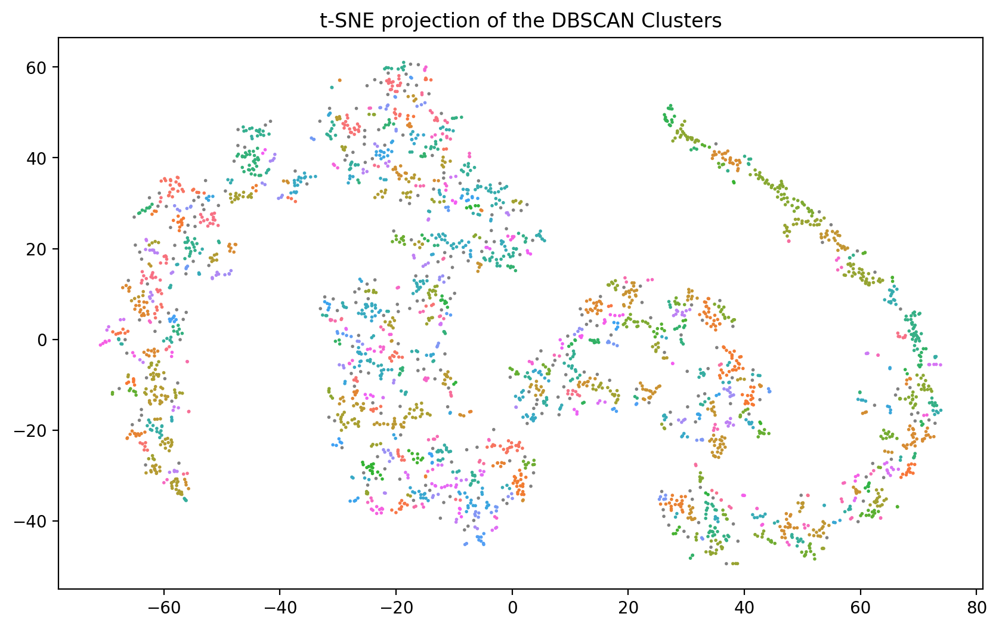

In [55]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns

# scaler = StandardScaler()
# X = dist.values
# X_normalized = scaler.fit_transform(X)

# Perform dimensionality reduction using t-SNE
reducer = TSNE(n_components=2, perplexity=20, n_iter=1000)
X_tsne = reducer.fit_transform(X)

import matplotlib.pyplot as plt

# Replace HDBSCAN with DBSCAN
dbscan = DBSCAN(eps=1, min_samples=2)
clusters = dbscan.fit(X_tsne)

# Plot the results
def plot_tsne(embedding, labels, s=1):
    unique_labels = len(set(labels))
    color_palette = sns.color_palette("husl", unique_labels - 1)
    cols = [int(x) for x in labels]
    colors = [color_palette[x] if x >= 0 else (0.5, 0.5, 0.5) for x in cols]
    plt.figure(figsize=(10, 6), dpi=200)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=colors, s=s, cmap="Spectral")
    plt.title('t-SNE projection of the DBSCAN Clusters', fontsize=12)
    plt.show()

plot_tsne(X_tsne, clusters.labels_, s=1)


/Users/gyf/.local/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


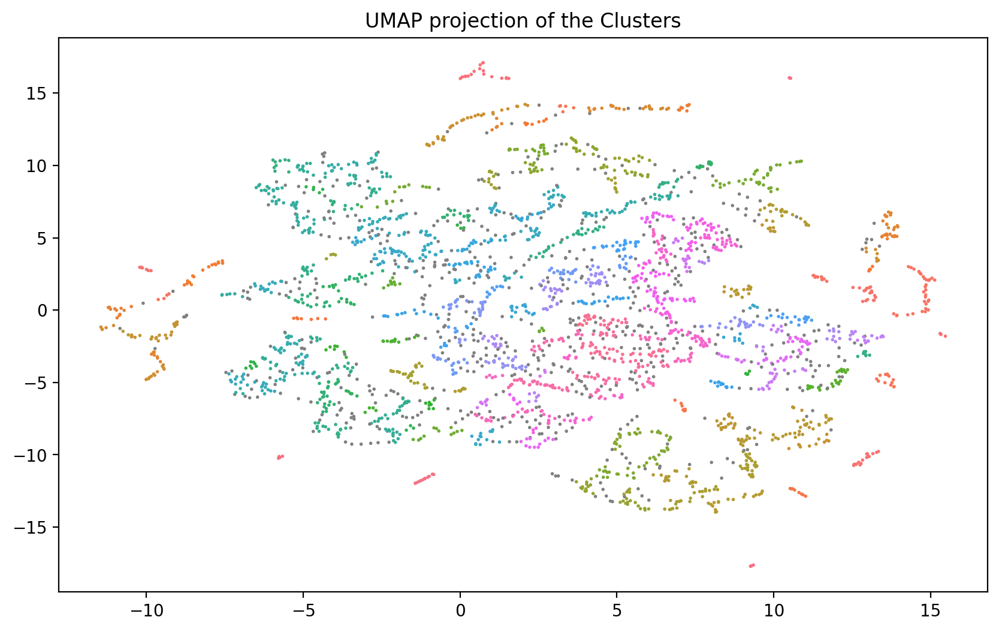

In [37]:
from hdbscan import HDBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap
from hdbscan import HDBSCAN
import seaborn as sns

# scaler = StandardScaler()
# X = dist.values
# X_normalized = scaler.fit_transform(X)

# Perform dimensionality reduction using UMAP
reducer = umap.UMAP(n_neighbors=3, min_dist=0.5) 
X_umap = reducer.fit_transform(X)

import matplotlib.pyplot as plt

hdbscan = HDBSCAN(min_cluster_size=3)
clusters = hdbscan.fit(X_umap)

# Plot the results
def plot_umap(embedding, labels, s=1):
    unique_labels = len(set(labels))
    color_palette = sns.color_palette("husl", unique_labels - 1)
    cols = [int(x) for x in labels]
    colors = [color_palette[x] if x >= 0 else (0.5, 0.5, 0.5) for x in cols]
    plt.figure(figsize=(10, 6), dpi=200)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=colors, s=s, cmap="Spectral")
    plt.title('UMAP projection of the Clusters', fontsize=12)
    plt.show()

plot_umap(X_umap, clusters.labels_, s=1)

In [324]:
import collections
cfips_list = dist.index.tolist()

def create_adjacency_list_cfips(cluster_labels, cfips_list):
    adjacency_list = collections.defaultdict(set)

    for idx, label in enumerate(cluster_labels):
        if label != -1:  # Exclude the noise points (label -1)
            for j, other_label in enumerate(cluster_labels):
                if idx != j and label == other_label:
                    adjacency_list[cfips_list[idx]].add(cfips_list[j])
    return adjacency_list

# Create the adjacency list using the cluster labels and cfips_list
adjacency_list_cfips = create_adjacency_list_cfips(clusters.labels_, cfips_list)

# Print the adjacency list
for node_cfips, neighbors_cfips in adjacency_list_cfips.items():
    print(f"Node {node_cfips} has neighbors: {neighbors_cfips}")
def get_neighbors_cfips(cfips, adjacency_list_cfips):
    return list(adjacency_list_cfips.get(cfips, set()))
dist['cfips'] = dist.index
dist['neighbors_cfips'] = dist.cfips.apply(lambda x: get_neighbors_cfips(x, adjacency_list_cfips))

dist

Node 1001 has neighbors: {13137, 42099, 48081, 48245}
Node 1003 has neighbors: {37097, 9003, 51125, 15001, 34013}
Node 1005 has neighbors: {37187, 17125, 40133, 51049, 37131, 28019, 5107, 29173, 48343, 21183}
Node 1007 has neighbors: {17057, 19047, 55119, 51195, 5149, 13183}
Node 1009 has neighbors: {48447, 48087}
Node 1011 has neighbors: {48131, 46085, 13193, 5133, 48163, 22059, 28079, 22067, 28095, 5057, 13001, 54095, 5073, 19159, 13273, 47067, 21087, 13283, 37091, 28007, 1129, 45033, 48107, 51053, 21231, 22003, 13173, 54009, 5111, 17017}
Node 1015 has neighbors: {53059, 27045, 51017, 55049, 36011, 40043, 31149, 24019, 18069, 40117, 36023, 26073, 39003, 18109, 55135}
Node 1019 has neighbors: {22083, 40105, 45009, 5047, 20189}
Node 1021 has neighbors: {19107, 31083, 48279, 39001, 39067}
Node 1023 has neighbors: {28037, 29069, 1047, 48415, 28063, 22047, 17065, 19133, 48191, 37185, 46023, 45001, 21077, 20187, 27101, 22117, 51173, 31091, 22009}
Node 1027 has neighbors: {17185, 35041, 391

cfips,1001,1003,1005,1007,1009,1011,1013,1015,1017,1019,...,56031,56033,56035,56037,56039,56041,56043,56045,cfips,neighbors_cfips
cfips,,,,,,,,,,,,,,,,,,,,,
1001,0.000000,29.556795,12.895536,11.874929,9.303092,14.101265,11.065914,2.829182,11.202628,12.504850,...,2.868046,505.161486,26.203104,2.095152,144.824318,5.660521,1.889969,9.392556,1001,"[13137, 42099, 48081, 48245]"
1003,29.556795,0.000000,42.437527,41.393925,38.844253,43.625468,40.379436,32.140328,40.736643,42.032006,...,27.985019,479.478507,4.196430,29.915355,115.351493,24.934053,31.191761,38.933490,1003,"[37097, 9003, 51125, 15001, 34013]"
1005,12.895536,42.437527,0.000000,1.215073,3.602387,1.396112,3.678453,10.351931,1.762304,0.665639,...,14.728440,516.635929,39.064970,12.720783,157.682454,17.941489,11.315041,3.523592,1005,"[37187, 17125, 40133, 51049, 37131, 28019, 510..."
1007,11.874929,41.393925,1.215073,0.000000,2.627938,2.266151,3.664661,9.275294,0.809200,0.850113,...,13.648139,515.931982,38.045908,11.655409,156.616432,16.856641,10.322504,2.552048,1007,"[17057, 19047, 55119, 51195, 5149, 13183]"
1009,9.303092,38.844253,3.602387,2.627938,0.000000,4.840657,3.203045,6.788592,1.956603,3.226506,...,11.202883,513.427685,35.472854,9.180298,154.100153,14.426233,7.731779,0.276581,1009,"[48447, 48087]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2.095152,29.915355,12.720783,11.655409,9.180298,13.881728,11.140612,2.796345,11.063668,12.283518,...,2.898179,506.029603,26.574103,0.000000,145.087843,6.158670,2.394657,9.263772,56037,[]
56039,144.824318,115.351493,157.682454,156.616432,154.100153,158.834973,155.677680,147.344418,155.968904,157.271863,...,143.049456,388.579364,118.897961,145.087843,0.000000,139.883555,146.470146,154.185277,56039,"[8097, 56033, 41061, 8105, 24013, 32017, 46099..."
56041,5.660521,24.934053,17.941489,16.856641,14.426233,19.036790,16.461905,7.744579,16.208644,17.553354,...,3.719376,501.879438,21.833589,6.158670,139.883555,0.000000,7.382519,14.501216,56041,[]


In [325]:
output = dist[['cfips', 'neighbors_cfips']]
output.to_csv('neighbors.csv')